In [1]:
%%capture
# install Necessary Packages
! pip install -U pymoo svgpath2mpl

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import random

from CP1.linkage_utils import *

from pymoo.core.problem import ElementwiseProblem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.variable import Real, Integer, Choice, Binary
from pymoo.core.mixed import MixedVariableMating, MixedVariableGA, MixedVariableSampling, MixedVariableDuplicateElimination
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PolynomialMutation
from pymoo.optimize import minimize

# deteministic random numbers
np.random.seed(0)
random.seed(0)

Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda12.initialize()
Traceback (most recent call last):
  File "/home/johnson/mambaforge/envs/topology/lib/python3.10/site-packages/jax/_src/xla_bridge.py", line 438, in discover_pjrt_plugins
    plugin_module.initialize()
  File "/home/johnson/mambaforge/envs/topology/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 78, in initialize
    options = xla_client.generate_pjrt_gpu_plugin_options()
AttributeError: module 'jaxlib.xla_client' has no attribute 'generate_pjrt_gpu_plugin_options'


# Linkage Synthesis Challenge Problem Advanced Code
Here we will tackle the problem with a more complex GA approach. First let's just load the target curves like we did before:


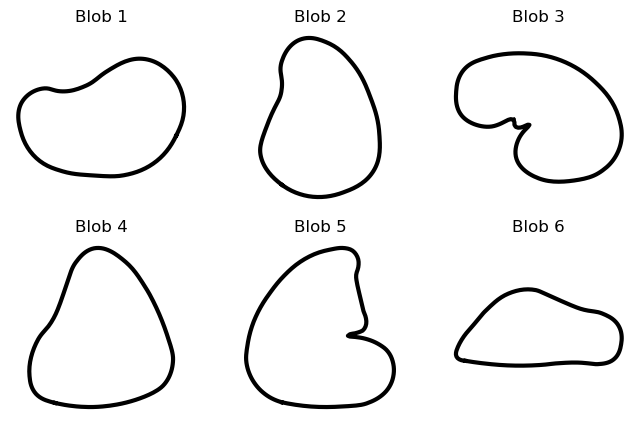

In [3]:
target_curves = np.load('target_curves.npy')

# Plot all target curves

# Initialize a 2x3 subplot for plotting all target curves
fig, axs = plt.subplots(2, 3, figsize=(8, 5))

# Loop through the 6 target curves to plot them
for i in range(6):
    # Extract x and y coordinates from the target curve
    x_coords = np.array(target_curves[i])[:, 0]
    y_coords = np.array(target_curves[i])[:, 1]

    # Plot the curve on the respective subplot
    axs[i // 3, i % 3].plot(x_coords, y_coords, color='black', linewidth=3)

    # Set title for each subplot
    axs[i // 3, i % 3].set_title(f'Blob {i + 1}')

    # Ensure equal scaling for x and y axes
    axs[i // 3, i % 3].axis('equal')
    axs[i // 3, i % 3].axis('off')


## GA Full Mechanism Generation
To set up the problem within Pymoo we will have to come up with a 1D representation of the mechanisms. We already gave you code to create 1D representations! This code effectively just flattens the matrices and variables describing our mechanism into a single vector. However, this representation scheme is highly suboptimal, and can be improved significantly. As a demonstration, we will slightly improve upon this representation, though we encourage you to take this further. We know the connectivity matrix is symmetric and has a diagonal equal to zero. To avoid making the optimization come up with the whole connectivity matrix we will only have it come up with the upper triangular half of the matrix (Not including the diagonal). This means the algorithm has to come up with $\frac{N^2-N}{2}$ 0s or 1s (i.e., booleans) to construct the adjacency matrix. We can further simplify the process by selecting a fixed motor position and having the optimization build the rest of the mechanism, removing the need for the optimization to determine the motor as well as reducing the number of 0s and 1s in the upper triangular portion by one (Saving 3 parameters in the representation). To do this we will start with the following mechanism (<b>The random generator also does this by default!</b>):

<img src="https://i.ibb.co/mGywWgr/start.jpg" alt="start" border="0">

We set Node 0 to ground and Node 1 to be ordinary and the motor to be <code>[1,0]</code>. Now we know that the upper triangular portion of the connectivity matrix starts with:

<img src="https://i.ibb.co/5RqKYQN/upper-triangular-fromstart.jpg" alt="upper-triangular-fromstart" border="0">

Since we know the types of the first two nodes, we save another two parameters from the optimization. At this point we will have the same representation as we have before, but with fewer numbers and no motor or N (size of mechanisms) as we generate the mechanism to have a certain size.

<img src="https://i.ibb.co/gv2D0Y5/Optimization-Represenation.png" alt="Optimization-Represenation" border="0">

Now that we a (slightly) improved 1D representation scheme, we will set up our problem with this many parameters. We also need to specify our constraints! Inequality constraints can be set in Pymoo (See: [constraints in pymoo](https://www.pymoo.org/misc/constraints.html?highlight=const)) as less than or equal to zero constraints. We will set the two constraints on chamfer distance and material use in our problem.

So based on this lets get started with defining the problem in Pymoo.
<ul>
    <li>
        <code>__init__</code>: We need to differentiate between datatypes because crossover, sampling, and mutation will happen slightly differently based on datatype. As such, we create a dictionary of variables and specify which type of variable each one is.
    </li>
    <li>
<code>convert_1D_to_mech</code>: Reformats our dictionary of variables into design info that our simulator uses (C, x0, etc.). You will need to update this function if you change the way you parameterize mechanisms. IMPORTANT: This function should not be confused for the <code>from_1d_representation</code> function used for submissions. We have also provided a function, <code> convert_mech_to_1D </code> to do the opposite, which you may find useful. It is currently unused and is commented out.
    </li>
    <li>
<code>_evaluate</code>: Next, we define the evaluation function. We construct the mechanism using <code>convert_1D_to_mech</code>. Next, we pass our mechanism to the simulator. If the mechanism is locking or over/underdefined, we set the objective scores to infinity. We then normalize, rasterize, calculate the bidirectional chamfer distance to the target, and evaluate the material usage. This will give us our two scoring objectives for this particular mechanism.
    </li>
</ul>

In [4]:
class mechanism_synthesis_optimization(ElementwiseProblem):

    # When intializing, set the mechanism size and target curve
    def __init__(self, target_point_cloud, N = 5):
        self.N = N
        variables = dict()

        # The upper triangular portion of our NxN Connectivity Matrix consists of Nx(N-1)/2 boolean variables:
        for i in range(N):
            for j in range(i):
                variables["C" + str(j) + "_" + str(i)] = Binary()

        # We Delete C0_1 since we know node 1 is connected to the motor
        del variables["C0_1"]

        #Our position matrix consists of Nx2 real numbers (cartesian coordinate values) between 0 and 1
        for i in range(2*N):
            variables["X0" + str(i)] = Real(bounds=(0.0, 1.0))

        # Our node type vector consists of N boolean variables (fixed vs non-fixed)
        for i in range(N):
            variables["fixed_nodes" + str(i)] =  Binary(N)

        # Our target node is an integer between 1 and N-1, (any except the motor node).
        variables["target"] = Integer(bounds=(1,N-1))

        # Set up some variables in the problem class we inherit for pymoo
        # n_obj=number of objectives, n_constr=number of constraints
        # Our objectives are chamfer distance and material, and they both have constraints.
        super().__init__(vars=variables, n_obj=2, n_constr=2)

        # Store the target curve point cloud
        self.tpc = target_point_cloud


    def convert_1D_to_mech(self, x):
        N = self.N

        # Get target node value
        target = x["target"]

        # Build connectivity matrix from its flattened constitutive variables
        C = np.zeros((N,N))
        x["C0_1"] = 1

        for i in range(N):
            for j in range(i):
                C[i,j] = x["C" + str(j) + "_" + str(i)]
                C[j,i] = x["C" + str(j) + "_" + str(i)]

        # Reshape flattened position matrix to its proper Nx2 shape
        x0 = np.array([x["X0" + str(i)] for i in range(2*N)]).reshape([N,2])

        # Extract a list of Nodes that are fixed from boolean fixed_nodes vector
        fixed_nodes = np.where(np.array([x["fixed_nodes" + str(i)] for i in range(N)]))[0].astype(int)

        #We fix the motor and original ground node as 0 and 1 respectively in this implementation
        motor=np.array([0,1])

        return target, C, x0, fixed_nodes, motor

    def convert_mech_to_1D(self, C, x0, fixed_nodes, target):
        N = self.N
        S = C.shape[0]

        # Initialize dictionary to store 1D representation of mechanism
        x = {}

        # Store target node value
        x["target"] = target

        # Store connectivity matrix in its flattened form
        if C.shape[0] != N:
            C = np.pad(C, ((0, N - C.shape[0]), (0, N - C.shape[1])), 'constant', constant_values=0)
        for i in range(N):
            for j in range(i):
                x["C" + str(j) + "_" + str(i)] = C[i,j]

        del x["C0_1"]
        
        # Store position matrix in its flattened form
        if x0.shape[0] != N:
            x0 = np.pad(x0, ((0, N - x0.shape[0]), (0, 0)), 'constant', constant_values=0)
            
        for i in range(2*N):
            x["X0" + str(i)] = x0.flatten()[i]

        # Store fixed nodes in boolean vector form
        for i in range(N):
            x["fixed_nodes" + str(i)] = (i in fixed_nodes) or (i>=S)

        return x

    def _evaluate(self, x, out, *args, **kwargs):
        #Convert to mechanism representation
        target, C, x0, fixed_nodes, motor = self.convert_1D_to_mech(x)
        
        # Simulate
        valid, CD, mat, _, _ = evaluate_mechanism(C,x0,fixed_nodes, motor, self.tpc, idx=target,device='cpu',timesteps=2000)
        
        if not valid:
            # if mechanism is invalid set the objective to infinity
            out["F"] = [np.Inf,np.Inf]
            out["G"] = [np.Inf, np.Inf]
        else:
            out["F"] = [CD,mat]

            # Set constraints as CD<=0.5 and Material<=6.0
            # Be careful about modifying these - designs that
            # violate the problem constraints will not be scored.
            out["G"] = [CD - 0.1, mat - 10.0]


Now let's try this with NSGA-II and one of the easier target curves. We will initialize with mechanisms with 5 nodes. You can test what happens if you increase this number. You should quickly discover that this naive parameterization does not perform well when initializing the GA with more complex mechanisms:

(-0.2373162917792797,
 0.22283070906996727,
 -0.15672720298171045,
 0.16977279707789422)

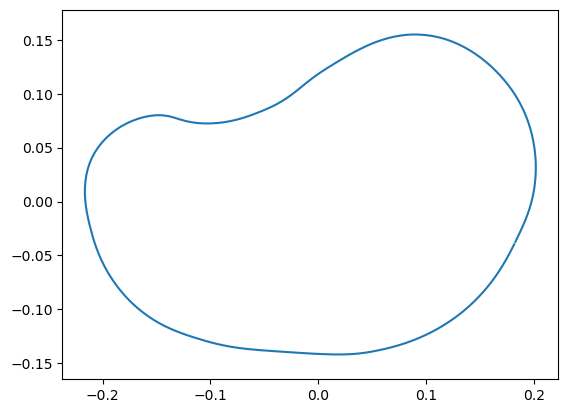

In [5]:
# Get target curve 0 and plot
target_index = 0
target_curve = np.array(target_curves[target_index])
plt.plot(target_curve[:,0],target_curve[:,1])
plt.axis('equal')

In [6]:
# Setup Problem
problem = mechanism_synthesis_optimization(target_curve,5)

# Set up GA with pop size of 100 -- see pymoo docs for more info on these settings!
algorithm = NSGA2(pop_size=100, sampling=MixedVariableSampling(),
                  mating=MixedVariableMating(eliminate_duplicates=MixedVariableDuplicateElimination()),
                  eliminate_duplicates=MixedVariableDuplicateElimination())


# Run for 100 generations -- see pymoo docs for more info on these settings!
results = minimize(problem,
                   algorithm,
                   ('n_gen', 100),
                   verbose=True,
                   save_history=True,
                   seed=10,
                  )

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      100 |      1 |           INF |           INF |             - |             -
     2 |      200 |      1 |           INF |           INF |             - |             -
     3 |      300 |      1 |           INF |           INF |             - |             -
     4 |      400 |      1 |           INF |           INF |             - |             -
     5 |      500 |      1 |           INF |           INF |             - |             -
     6 |      600 |      1 |  0.4705211759 |           INF |             - |             -
     7 |      700 |      1 |  0.4705211759 |           INF |             - |             -
     8 |      800 |      1 |  0.4705211759 |           INF |             - |             -
     9 |      900 |      1 |  0.4705211759 |           INF |             - |             -
    10 |     1000 |      1 |  0.4705211759 |           INF |             - |             -

Pymoo automatically saves the optimal set of solutions and their corresponding performance. <code>results.X</code> will contain the solutions in 1D representation and <code>results.F</code> will contain the objectives. Note that if none of the solutions meet the constraints, the algorithm will not save anything on the best solutions). The constraints that we specify in the problem guidelines are used as a reference point for hypervolume calculations which we will use to measure your submissions performance.

Hyper Volume ~ 0.244020


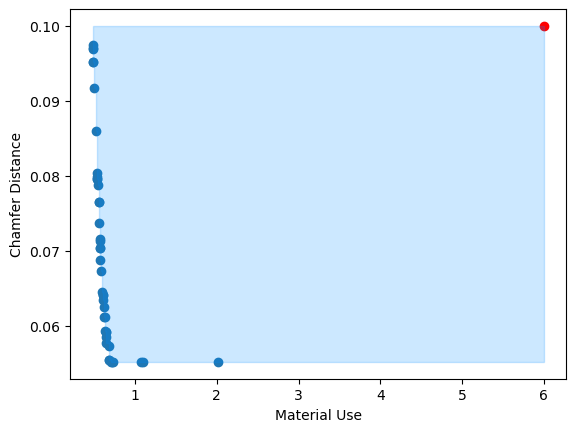

In [7]:
from pymoo.indicators.hv import HV

def plot_HV(F, ref):

    #Plot the designs
    plt.scatter(F[:,1],F[:,0])

    #plot the reference point
    plt.scatter(ref[1],ref[0],color="red")

    #plot labels
    plt.xlabel('Material Use')
    plt.ylabel('Chamfer Distance')

    #sort designs and append reference point
    sorted_performance = F[np.argsort(F[:,1])]
    sorted_performance = np.concatenate([sorted_performance,[ref]])

    #create "ghost points" for inner corners
    inner_corners = np.stack([sorted_performance[:,0], np.roll(sorted_performance[:,1], -1)]).T

    #Interleave designs and ghost points
    final = np.empty((sorted_performance.shape[0]*2, 2))
    final[::2,:] = sorted_performance
    final[1::2,:] = inner_corners

    #Create filled polygon
    plt.fill(final[:,1],final[:,0],color="#008cff",alpha=0.2)

if not results.X is None:
    #Specify reference point
    ref_point = np.array([0.1, 6.0])

    #Calculate Hypervolume
    ind = HV(ref_point)
    hypervolume = ind(results.F)

    #Print and plot
    print('Hyper Volume ~ %f' %(hypervolume))
    plot_HV(results.F, ref_point)
else:
    print('Did Not Find Solutions!!')

Now lets plot the results for the best chamfer distance solution

In [8]:
if not results.X is None:
    if type(results.X)!=dict:
        best_sol = results.X[np.argmin(results.F[:,0])]
    else:
        best_sol = results.X
else:
    print('Did Not Find Solutions!!')

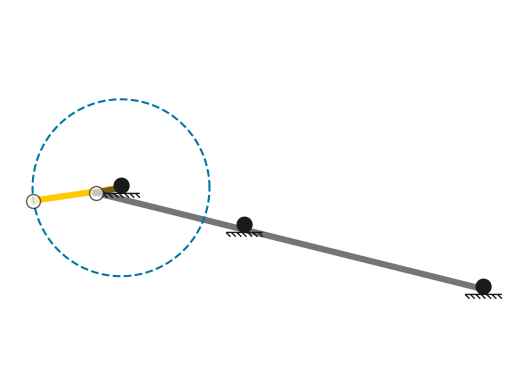

In [9]:
if not results.X is None:
    # Step 1: Reshape
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(best_sol)
    # target, C, x0, fixed_nodes, motor  = problem.fix_mechanism(target, C, x0, fixed_nodes, motor )
    # Step 2: Draw
    draw_mechanism(C,x0,fixed_nodes,motor)

else:
    print('Did Not Find Solutions!!')

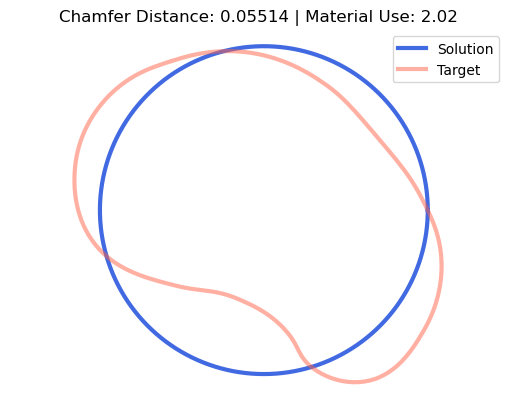

In [11]:
def comparecurves(C, x, fixed_nodes, motor, target, target_pc):
    valid, CD, mat, sol, aligned_curve = evaluate_mechanism(C,x,fixed_nodes, motor, target_pc, idx=target,device='cpu',timesteps=2000)
    # target_pc = get_oriented(target_pc)
    plt.plot(sol[:,0],sol[:,1], color='royalblue', linewidth=3)
    plt.plot(aligned_curve[:,0],aligned_curve[:,1], color='tomato', alpha=0.5, linewidth=3)
    plt.title(f"Chamfer Distance: {CD:.5f} | Material Use: {mat:.2f}")
    plt.axis('equal')
    plt.axis('off')
    plt.legend(['Solution','Target'])
if not results.X is None:
    comparecurves(C, x0, fixed_nodes, motor, target, target_curve)
else:
    print('Did Not Find Solutions!!')


Now lets see the solution with the least material use

In [12]:
if not results.X is None:
    if type(results.X)!=dict:
        best_sol = results.X[np.argmin(results.F[:,1])]
    else:
        best_sol = results.X
else:
    print('Did Not Find Solutions!!')

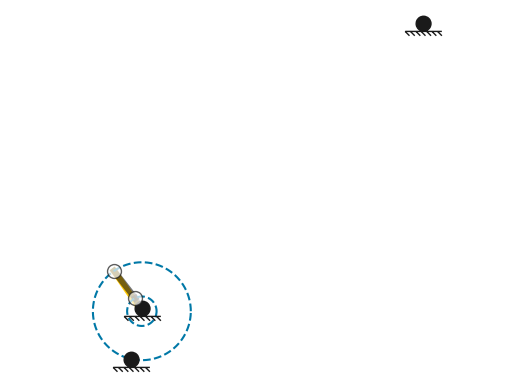

In [13]:
if not results.X is None:
    # Step 1: Reshape
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(best_sol)

    # Step 2: Draw
    draw_mechanism(C,x0,fixed_nodes,motor)
else:
    print('Did Not Find Solutions!!')

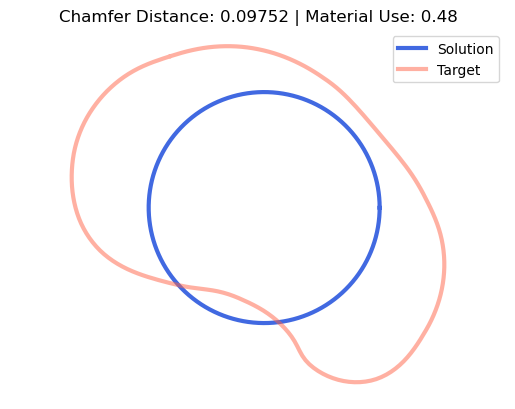

In [14]:
if not results.X is None:
    comparecurves(C, x0, fixed_nodes, motor, target, target_curve)
else:
    print('Did Not Find Solutions!!')

Now lets visualize the pareto front of the last generation

  0%|          | 0/39 [00:00<?, ?it/s]

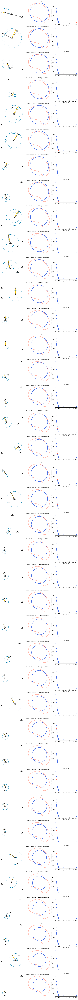

In [15]:
if not results.X is None:
    # first get generalized 1D representation
    mechanisms = []

    for x in results.pop.get("X"):
        target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(x)
        mechanisms.append(to_final_representation(C,x0,fixed_nodes,motor,target))
    # Visualize Pareto Front
    visualize_pareto_front(np.array(mechanisms),results.pop.get("F"),target_curve)
else:
    print('Did Not Find Solutions!!')

We can see that the GA has not actually found any valid mechanism other than having a simple motor. This is because finding valid mechanisms to begin with is rather difficult. To make things a bit easier let's take our starter mechanisms we had in the prior example and initialize the GA with that mechanism. and see how that goes:

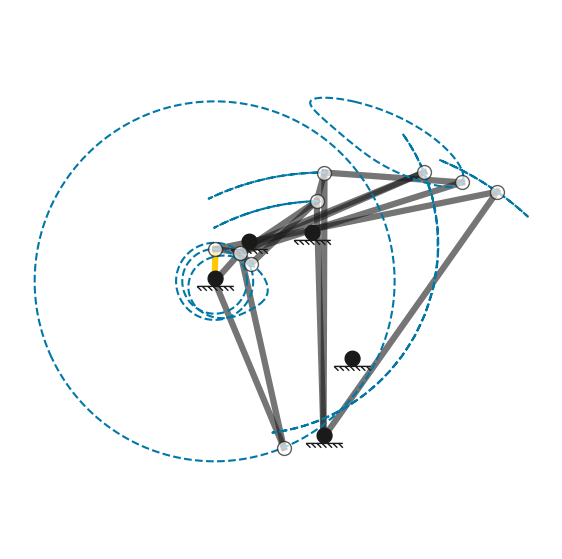

In [16]:
# load the starter mechanism
starter_mech = np.load('starter_mechanism.npy',allow_pickle=True).item() #Load mechanism
C,x0,fixed_nodes,motor = starter_mech['C'],starter_mech['x0'],starter_mech['fixed_nodes'],starter_mech['motor'] #Extract variables
x0 = x0 * 0.7 # making the mechanism smaller to allow the material limit constraint to be satisfied faster
plt.figure(figsize=(7,7))
draw_mechanism(C,x0,fixed_nodes,motor) #Draws mechanism

In [17]:
# Setup Problem
problem = mechanism_synthesis_optimization(target_curve,14) # setting size to a maximum of 14 which is the size of the starter mechanism

X_init = problem.convert_mech_to_1D(C,x0,fixed_nodes,C.shape[0]-1) #Convert to 1D representation

from pymoo.core.sampling import Sampling

class MySampling(Sampling):

    def _do(self, problem, n_samples, **kwargs):
        X = []

        for i in range(n_samples):
            X.append(X_init)

        return X

# Set up GA with pop size of 100 -- see pymoo docs for more info on these settings!
algorithm = NSGA2(pop_size=100, sampling=MySampling(),
                  mating=MixedVariableMating(eliminate_duplicates=MixedVariableDuplicateElimination()),
                  eliminate_duplicates=MixedVariableDuplicateElimination())


# Run for 100 generations -- see pymoo docs for more info on these settings!
results = minimize(problem,
                   algorithm,
                   ('n_gen', 200),
                   verbose=True,
                   save_history=True,
                   seed=5,
                  )

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |        1 |      1 |  0.0405772865 |  0.0405772865 |             - |             -
     2 |      101 |      1 |  0.0357008964 |           INF |             - |             -
     3 |      201 |      1 |  0.0357008964 |           INF |             - |             -
     4 |      301 |      1 |  0.0357008964 |           INF |             - |             -
     5 |      401 |      1 |  0.0357008964 |           INF |             - |             -
     6 |      501 |      1 |  0.0357008964 |           INF |             - |             -
     7 |      601 |      1 |  0.0357008964 |  0.2436337884 |             - |             -
     8 |      701 |      1 |  0.0164193153 |  0.1363064706 |             - |             -
     9 |      801 |      1 |  0.0163846627 |  0.0802041142 |             - |             -
    10 |      901 |      1 |  0.0141042262 |  0.0609007740 |             - |             -

Pymoo automatically saves the optimal set of solutions and their corresponding performance. <code>results.X</code> will contain the solutions in 1D representation and <code>results.F</code> will contain the objectives. Note that if none of the solutions meet the constraints, the algorithm will not save anything on the best solutions). The constraints that we specify in the problem guidelines are used as a reference point for hypervolume calculations which we will use to measure your submissions performance.

Hyper Volume ~ 0.318921


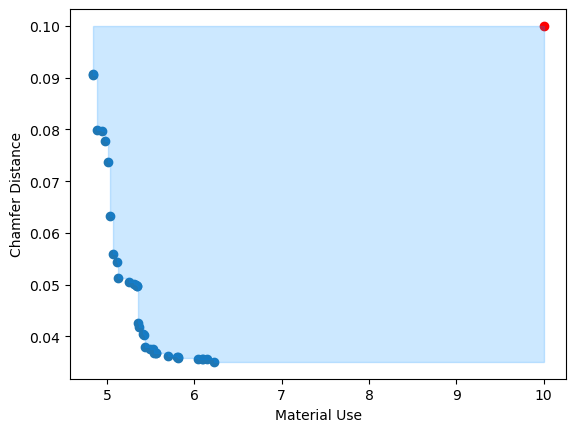

In [21]:
from pymoo.indicators.hv import HV

def plot_HV(F, ref):

    #Plot the designs
    plt.scatter(F[:,1],F[:,0])

    #plot the reference point
    plt.scatter(ref[1],ref[0],color="red")

    #plot labels
    plt.xlabel('Material Use')
    plt.ylabel('Chamfer Distance')

    #sort designs and append reference point
    sorted_performance = F[np.argsort(F[:,1])]
    sorted_performance = np.concatenate([sorted_performance,[ref]])

    #create "ghost points" for inner corners
    inner_corners = np.stack([sorted_performance[:,0], np.roll(sorted_performance[:,1], -1)]).T

    #Interleave designs and ghost points
    final = np.empty((sorted_performance.shape[0]*2, 2))
    final[::2,:] = sorted_performance
    final[1::2,:] = inner_corners

    #Create filled polygon
    plt.fill(final[:,1],final[:,0],color="#008cff",alpha=0.2)

if not results.X is None:
    #Specify reference point
    ref_point = np.array([0.1, 10.0])

    #Calculate Hypervolume
    ind = HV(ref_point)
    hypervolume = ind(results.F)

    #Print and plot
    print('Hyper Volume ~ %f' %(hypervolume))
    plot_HV(results.F, ref_point)
else:
    print('Did Not Find Solutions!!')

Now lets plot the results for the best chamfer distance solution

In [22]:
if not results.X is None:
    if type(results.X)!=dict:
        best_sol = results.X[np.argmin(results.F[:,0])]
    else:
        best_sol = results.X
else:
    print('Did Not Find Solutions!!')

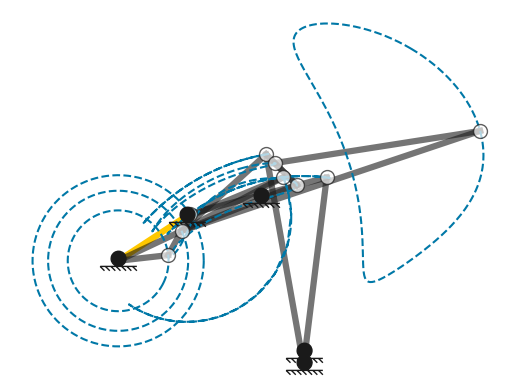

In [23]:
if not results.X is None:
    # Step 1: Reshape
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(best_sol)
    # target, C, x0, fixed_nodes, motor  = problem.fix_mechanism(target, C, x0, fixed_nodes, motor )
    # Step 2: Draw
    draw_mechanism(C,x0,fixed_nodes,motor)

else:
    print('Did Not Find Solutions!!')

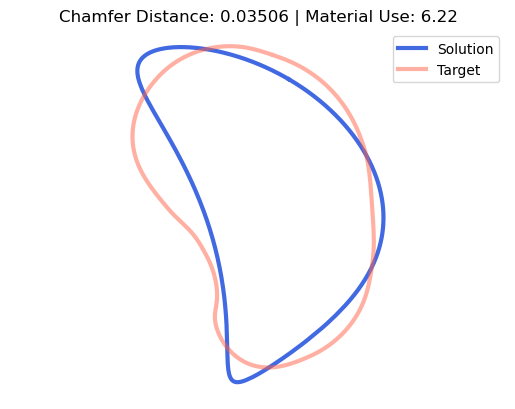

In [24]:
if not results.X is None:
    comparecurves(C, x0, fixed_nodes, motor, target, target_curve)
else:
    print('Did Not Find Solutions!!')


Now lets see the solution with the least material use

In [25]:
if not results.X is None:
    if type(results.X)!=dict:
        best_sol = results.X[np.argmin(results.F[:,1])]
    else:
        best_sol = results.X
else:
    print('Did Not Find Solutions!!')

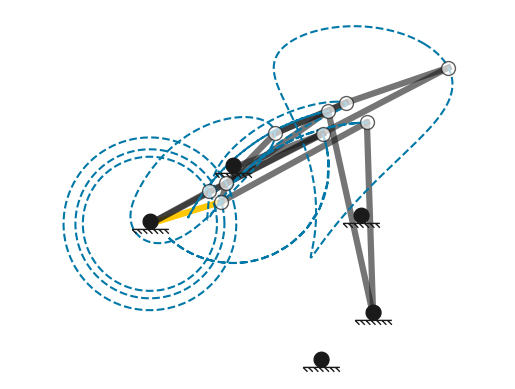

In [26]:
if not results.X is None:
    # Step 1: Reshape
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(best_sol)

    # Step 2: Draw
    draw_mechanism(C,x0,fixed_nodes,motor)
else:
    print('Did Not Find Solutions!!')

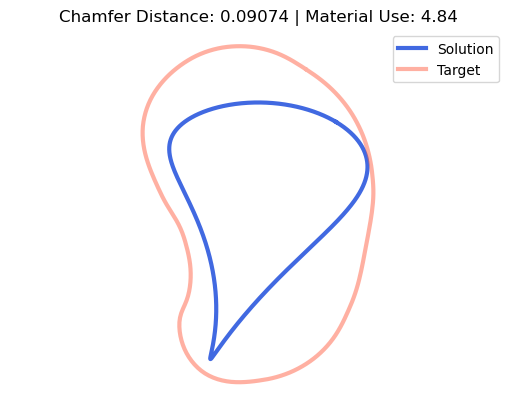

In [27]:
if not results.X is None:
    comparecurves(C, x0, fixed_nodes, motor, target, target_curve)
else:
    print('Did Not Find Solutions!!')

Now lets visualize the pareto front of the last generation

  0%|          | 0/33 [00:00<?, ?it/s]

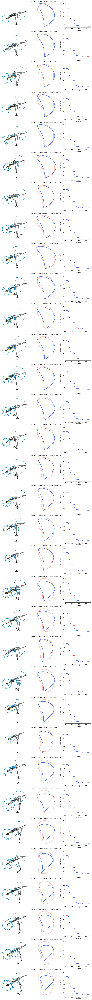

In [28]:
if not results.X is None:
    # first get generalized 1D representation
    mechanisms = []

    for x in results.pop.get("X"):
        target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(x)
        mechanisms.append(to_final_representation(C,x0,fixed_nodes,motor,target))
    # Visualize Pareto Front
    visualize_pareto_front(np.array(mechanisms),results.pop.get("F"),target_curve)
else:
    print('Did Not Find Solutions!!')

As you can see the GA still seems to be stuck on a handful of solutions and has picked. How can we improve upon this?
Below there are some functions that may be useful in this case!

## Other Included Functions and Hints:
In linkage_utils.py you can find a few more useful functions that have not been discussed in either notebook which could be very helpful in improving the performance of your models!
below are the most important of these functions:

We include a function in `linkage_utils` called  `random_generator_ns(n=#)` which takes a named variable `n` which indicates maximum joint count of a desired mechanism and outputs a **valid** random mechanism with `n` joints. Let's generate a few of these with random sizes between 6 to 20:

  0%|          | 0/6 [00:00<?, ?it/s]

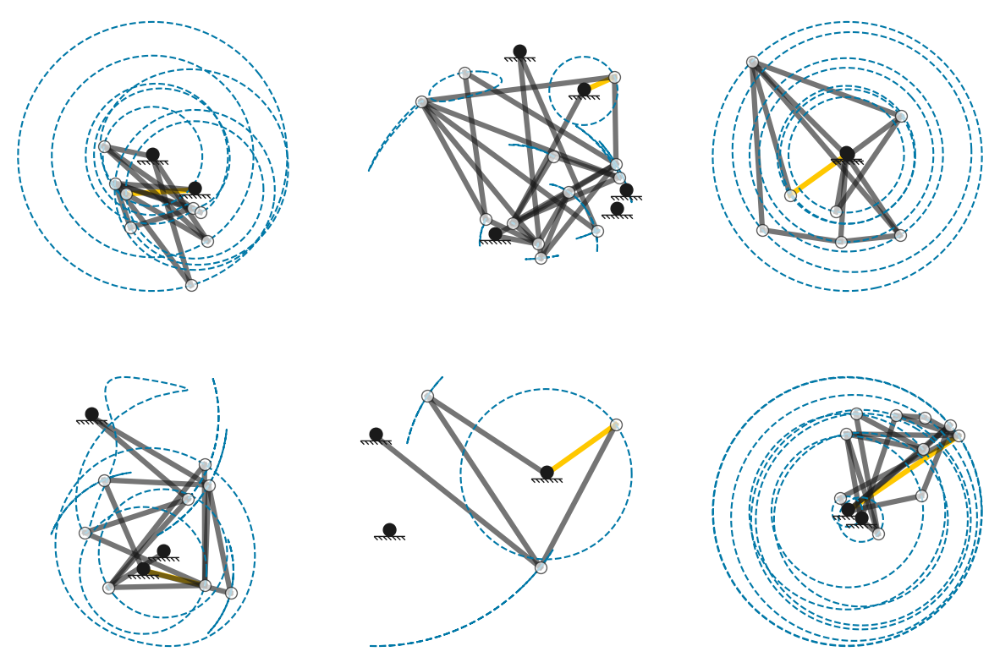

In [29]:
# Initialize population list

population = []

# Create subplots
fig, axs = plt.subplots(2, 3,figsize=(15,10))

# Loop to generate and plot 6 random mechanisms
for i in trange(6):

    # Generate a random mechanism
    C,x0,fixed_nodes,motor = random_generator_ns(n=np.random.randint(6,21))

    # Plot Mechanism
    draw_mechanism_on_ax(C,x0,fixed_nodes,motor,axs[i//3,i%3])

    # Last node is target
    target = C.shape[0]-1

    # Convert to 1D and add to population
    population.append(to_final_representation(C,x0,fixed_nodes,motor,target))

As we saw in the demo we also have functions for gradient based optimization. We have prepared a function, `optimization_functions` which creates the necassry function for optimization. It takes in a connectivity matrix, node coorinates, a list of ground nodes, and a target curve as input. It simulates the motion of the mechanism, and differentiably claculates distance to the target curve and the total sum of link lengths for the mechanism. Specifically, it returns six items:

1. v: Whether the provided mechanism is valid. There are many ways a mechanism can be invalid. It can be over- or under-constrainted, meaning that the mechanism either cannot move, or its movement is indeterminate, respectively. In addition, even if it is correctly-constrained, the mechanism can lock before it is able to complete a full rotation. We consider such locking mechanisms invalid as well.
2. obj_fn: A function which takes a set of node coordinates and returns the distance to the target curve (objective function).
3. obj_fn_grad: A function which takes a set of node coordinates and returns the gradient of the distance to the target curve with respect to the node coordinates.
4. mat_fn: A function which takes a set of node coordinates and returns the total length of all links in the mechanism (material use).
5. mat_fn_grad: A function which takes a set of node coordinates and returns the gradient of the total length of all links in the mechanism with respect to the node coordinates.
3. aligned_curve: The transformed target curve that is aligned with the mechanism output.

Now let's see how optimizing a the best material use solution from GA would play out:

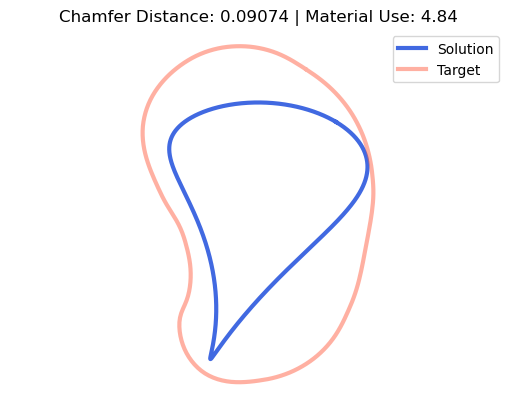

In [46]:
if not results.X is None:
    if type(results.X)!=dict:
        best_sol = results.X[np.argmin(results.F[:,1])]
    else:
        best_sol = results.X
        
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(best_sol)
else:
    print('Did Not Find Solutions!!')

comparecurves(C, x0, fixed_nodes, motor, target, target_curve)

In [47]:
v, obj_fn, obj_fn_grad, mat_fn, mat_fn_grad, aligned_curve = optimization_functions(C,x0,fixed_nodes,target_curve, motor, target)

from scipy.optimize import minimize as scipy_minimize
x_history = []
CD_history = []
def callback(x):
    x_history.append(x)
    CD_history.append(obj_fn(x))
res = scipy_minimize(obj_fn, x0.reshape(-1), jac=obj_fn_grad, method='BFGS', callback=callback, options={'gtol': 1e-9, 'maxiter': 200})

Text(0.5, 0, 'Iteration')

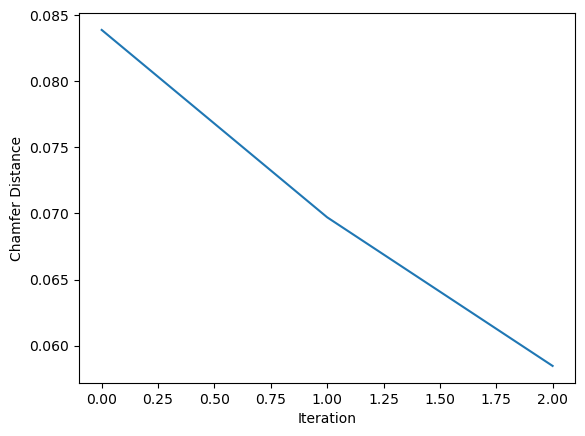

In [48]:
plt.plot(CD_history)
plt.ylabel("Chamfer Distance")
plt.xlabel("Iteration")

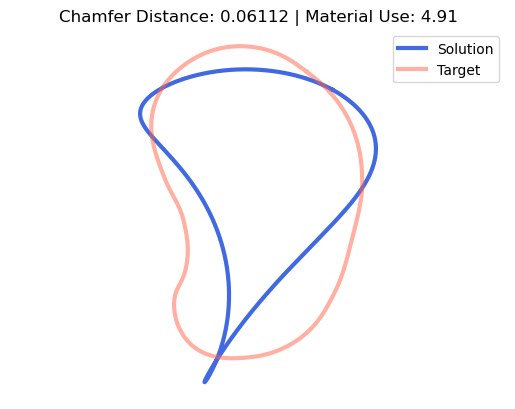

In [49]:
comparecurves(C, res.x.reshape(x0.shape), fixed_nodes, motor, C.shape[0]-1, target_curve)

We can also optimize all of the pareto front and add it to the final population:

In [52]:
Final_population = results.X.tolist()

for b_sol in results.X:
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(b_sol)
    v, obj_fn, obj_fn_grad, mat_fn, mat_fn_grad, aligned_curve = optimization_functions(C,x0,fixed_nodes,target_curve, motor, target)
    x_history = []
    CD_history = []
    def callback(x):
        x_history.append(x)
        CD_history.append(obj_fn(x))
    res = scipy_minimize(obj_fn, x0.reshape(-1), jac=obj_fn_grad, method='BFGS', callback=callback, options={'gtol': 1e-9, 'maxiter': 200})
    
    Final_population.append(problem.convert_mech_to_1D(C,res.x.reshape(x0.shape),fixed_nodes,target))

In [68]:
problem.evaluate(Final_population)[0]

(68, 2)

  0%|          | 0/30 [00:00<?, ?it/s]

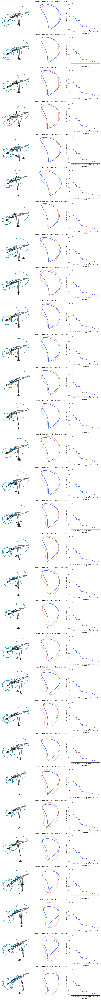

In [69]:
F,C = problem.evaluate(Final_population)
# remove invalid solutions
valid = np.where(np.sum(C>0,axis=1)==0)
F = F[valid]
mechanisms = []
for x in np.array(Final_population)[valid]:
    target, C, x0, fixed_nodes, motor  = problem.convert_1D_to_mech(x)
    mechanisms.append(to_final_representation(C,x0,fixed_nodes,motor,target))
visualize_pareto_front(np.array(mechanisms),F,target_curve)

In [72]:
ind = HV(ref_point)
hypervolume = ind(F)
print('Hyper Volume ~ %f' %(hypervolume))

Hyper Volume ~ 0.339939


We see some improvement in hypervolume by doing this. How else can we make this better?